<a href="https://colab.research.google.com/github/precessioncap/holocene-colab/blob/main/Copy_of_Liquity_Macroeconomic_Model_Theory_%26_Results.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Parameters and Initialization

In [ ]:
import random
import numpy as np
import pandas as pd
import plotly.graph_objects as go
import plotly.express as px
import matplotlib.pyplot as plt
import scipy.stats
from plotly.subplots import make_subplots

#policy functions
base_rate_initial = 0
base_rate_beta = 2
base_rate_decay = 0.917
rate_issuance = 0.01
rate_redemption = 0.01
rate_issuance_min = 0.005
rate_redemption_min = 0.005
# airdrop
quantity_LQTY_airdrop = 1902.6

#global variables
day = 24
month = 24 * 30
year = 24 * 365
period = year

#number of runs in simulation
#n_sim = 8640
n_sim = year

# Ether price (exogenous)

Ether is the collateral for LUSD. The ether price $P_t^e$ follows 
> $P_t^e = P_{t-1}^e (1+\zeta_t^e)(1+\sigma_t^e)$, 

where $\zeta_t^e \sim N(0, $ sd_ether$)$ represents ether price shock and $\sigma_t^e$ the drift of ether price. At the end of the year, the expected ether price is:
> $E(P_{8760}^e) = P_0^e \cdot (1 +$ drift_ether$)^{8760}$


In [ ]:
#ether price
price_ether_initial = 1000
price_ether = [price_ether_initial]
sd_ether=0.02
drift_ether = 0
ether_price_one_year = price_ether_initial * (1 + drift_ether)**8760
print("Expected ether price at the end of the year: $", ether_price_one_year)

Expected ether price at the end of the year: $ 1000


# LQTY price
In the first month, the price of LQTY follows

> $P_t^q = P_{t-1}^q (1+\zeta_t^q)(1+\sigma_t^q)$. 

Note that $\zeta_t^q \sim N(0,$ sd_LQTY) represents LQTY price shock and $\sigma_t^q$ the drift. Here, $\sigma_t^q =$ drift_LQTY, so that the expected LQTY price increases from price_LQTY_initial to the following at the end of the first month:
> $E(P_{720}^q) = $price_LQTY_initial$ \cdot (1+$ drift_LQTY$)^{720}$

The LQTY price from the second month on is endogenously determined.

In [ ]:
#LQTY price
price_LQTY_initial = 0.4
price_LQTY = [price_LQTY_initial]
sd_LQTY=0.005
drift_LQTY = 0.0035
print("Expected LQTY at the end of first month: $", price_LQTY_initial * (1 + drift_LQTY)**720)
supply_LQTY=[0]
LQTY_total_supply=100000000

Expected LQTY at the end of first month: $ 4.949613690391814


**LQTY Endogenous Price**

The staked LQTY pool earning consists of the issuance fee revenue and redemption fee revenue
> $R_t^q = R_t^i + R_t^r.$

From period 721 onwards, using the data in the last 720 periods (i.e. the last 30 days), we can calculate the annualized earning

> $$E_t=\frac{365}{30}\sum_{\tau=t-720}^{t-1}R_\tau^q.$$

For example, in period 721 (the first hour of the second month), we can calculate the annualized earning

> $$E_{721}=\frac{365}{30}\sum_{\tau=1}^{720}R_\tau^q.$$

In period 722 (the second hour of the second month), we can calculate the annualized earning

> $$E_{722}=\frac{365}{30}\sum_{\tau=2}^{721}R_\tau^q.$$

The annualized earning $E_t$ takes into account the last 720 periods' earning only and then annualize it to represent the whole year's revenue.
Only the latest 720 periods matter! The earlier ones become irrelevant over time.

The P/E ratio is defined as follows

> $$r_t=r^{PE}(1 + \zeta_t^{PE}),$$

where $r^{PE} =$ PE_ratio ~and \zeta_t^{PE}\sim N(0, 0.1)~ $\zeta_t^{PE} = 0$.

> $$r_t=\frac{LQTY Market Cap}{Annualized Earning}=\frac{MC_t}{E_t}$$

> $MC_t=P_t^q \cdot$ LQTY_total_supply

Therefore, the LQTY price dynamics is determined
> $$P_t^q=discount \cdot \frac{r^{PE}}{LQTY\_total\_supply}E_t$$

Interpretation: The denominator implies that with more LQTY tokens issued, LQTY price decreases. However, the depreciation effect can be counteracted by the growth of the earning.


In [ ]:
#PE ratio
PE_ratio = 50

# Liquidity Pool

The demand of tokens from liquidity pool is defined by
> $$D_t^l = D_{t-1}^l (1+\zeta_t^l) (1+\sigma_t^l) (\frac{P_t^l}{P_{t-1}^l})^\delta, \\
D_0^l = liquidity\_initial$$

where $\zeta_t^l \sim N(0, sd\_liquidity)$ is the shock in the liquidity pool, $1+\sigma_t^l = drift\_liquidity$ and $\delta \leq -1$.

In [ ]:
# liquidity pool
liquidity_initial=0
sd_liquidity=0.001
drift_liquidity=1.0003
delta = -20

# Stability Pool

The demand of tokens from stability pool is defined by 
>$$D_t^s = D_{t-1}^s (1+\zeta_t^s) (1+R_{t-1}^s-R_{t}^n)^\theta, \\
D_0^s = stability\_initial$$

where $\zeta_t^s \sim N(0, sd\_stability)$ is the shock in the liquidity pool. 

During the first month the formula above is also multiplied by a drift factor, $drift\_stability$.

$R_{t-1}^s$ is the return in the stability pool, which consists of liquidation gain and airdrop LQTY gain.


The natural rate of the stability pool follows
> $$R_{t}^n=R_{t-1}^n(1+\zeta_t^n)\geq 0,$$

where $\zeta_t^n \sim N(0, sd\_return)$ is the natural rate shock and $R_{0}^n = natural\_rate\_initial$.

The natural rate compensates the opportunity cost and risk undertaken by the stability pool providers. It resembles the risk-free government bond return in the macroeconomics model. Stability pool depositors compare the return of the stability pool with the outside investment opportunities. A positive shock $\zeta_t^n$ implies investment on other platforms, e.g. Compound, Uniswap, Aave, yield higher returns, thus making the stability pool less appealing.


In [ ]:
#stability pool
initial_return = 0.2
return_stability = [initial_return]
sd_return = 0.001
stability_initial = 0
sd_stability = 0.001
drift_stability = 1.002
theta = 0.001

#natural rate
natural_rate_initial = 0.2
natural_rate = [natural_rate_initial]
sd_natural_rate = 0.002

# Trove pool

Each trove is defined by five numbers
> (collateral in ether, debt in LUSD, collateral ratio target, rational inattention, collateral ratio)

which can be denoted by
> ($Q_t^e(i)$, $Q_t^d(i)$, $CR^*(i)$, $\tau(i)$, $CR_t(i)$).


**Open Troves**

The amount of new troves opened in period t is denoted by $N_t^o$, which follows 


> $N_t^o = \begin{cases} 
initial\_open &\mbox{if } t = 0\\
max(0, n\_steady \cdot (1+\zeta_t^o)) &\mbox{if } P_{t-1}^l \leq 1 + f_t^i\\
max(0, n\_steady \cdot (1+\zeta_t^o)) + \alpha (P_{t-1}^l - (1 + f_t^i)) N_t &\mbox{otherwise }
\end{cases}
$

where the shock $\zeta_t^o \sim N(0,sd\_opentroves)$. 

$R_t^o$ represents the break-even natural rate of opening troves and $f_t^i$ represents the issuance fee.

$P_{t}^{l}$ is the price of LUSD.

$N_t^o$ is rounded to an integer.

---

The amount of LUSD tokens generated by a new trove is
> $$Q_t^d(i) = \frac{P_t^e Q_t^e(i)}{CR^*(i)}.$$

---


The distribution of ether $Q_t^e(i)$ follows
> $Q_t^e(i) \sim \Gamma(k, \theta)$

So that $E(Q_t^e) = collateral\_gamma\_k \cdot collateral\_gamma\_theta$ and $Var(Q_t^e) = \sqrt{collateral\_gamma\_k} \cdot collateral\_gamma\_theta$

---


$CR^*(i)$ follows a chi-squared distribution with $df=target\_cr\_chi\_square\_df$, i.e. $CR^*(i) \sim \chi_{df}^2$, so that $CR^*(i)\geq target\_cr\_a$:
> $CR^*(i) = target\_cr\_a + target\_cr\_b \cdot \chi_{df}^2$. 

Then:\
$E(CR^*(i)) = target\_cr\_a + target\_cr\_a * target\_cr\_chi\_square\_df$, \\
$SD(CR^*(i))=target\_cr\_b*\sqrt{2*target\_cr\_chi\_square\_df}$



---
Each trove is associated with a rational inattention parameter $\tau(i)$.

The collateral ratio of the existing troves vary with the ether price $P_t^e$
> $$CR_t(i) = \frac{P_t^e Q_t^e(i)}{Q_t^d(i)}.$$

If the collateral ratio falls in the range 
> $CR_t(i) \in [CR^*(i)-\tau(i), CR^*(i)+2\tau(i)]$,

no action taken. Otherwise, the trove owner readjusts the collateral ratio so that
>  $CR_t(i)=CR^*(i)$.

The distribution of $\tau(i)$ follows gamma distribution $\Gamma(k,\theta)$ with mean of $k\theta$ and standard error of $\sqrt{k\theta^2}$. 

In [ ]:
#open troves
initial_open=10
sd_opentroves=0.5
n_steady=0.5

collateral_gamma_k = 10
collateral_gamma_theta = 500

target_cr_a = 1.1
target_cr_b = 0.1
target_cr_chi_square_df = 16

rational_inattention_gamma_k = 4
rational_inattention_gamma_theta = 0.08

#sensitivity to LUSD price & issuance fee
alpha = 0.3

print("E(Q_t^e) = ", collateral_gamma_k * collateral_gamma_theta)
print("SD(Q_t^e) = ", collateral_gamma_k**(0.5) * collateral_gamma_theta)

print("E(CR^*(i)) = ", target_cr_a + target_cr_b * target_cr_chi_square_df * 100, "%")
print("SD(CR^*(i)) = ", target_cr_b * (2*target_cr_chi_square_df)**(1/2) * 100, "%")

print("E(tau) = ", rational_inattention_gamma_k * rational_inattention_gamma_theta * 100, "%")
print("SD(tau) = ", rational_inattention_gamma_k**(0.5) * rational_inattention_gamma_theta * 100, "%")

E(Q_t^e) =  5000
SD(Q_t^e) =  1581.1388300841897
E(CR^*(i)) =  161.1 %
SD(CR^*(i)) =  56.56854249492381 %
E(tau) =  32.0 %
SD(tau) =  16.0 %


**Close Troves**

The amount of troves closed in period t is denoted as $N_t^c$, which follows
> $$N_t^c = \begin{cases} 
U(0, 1) &\mbox{if } t \in [0,240] \\ 
max(0, n\_steady \cdot (1+\zeta_t^c)) &\mbox{if } P_{t-1}^l \geq 1 \\ 
max(0, n\_steady \cdot (1+\zeta_t^c)) + \beta(1 - P_{t-1}^l)N_t &\mbox{otherwise }
\end{cases} $$

where the shock $\zeta_t^c \sim N(0, sd\_closetroves)$. 
$N_t^c$ is rounded to an integer.

In [ ]:
#close troves
sd_closetroves=0.5
#sensitivity to LUSD price
beta = 0.2

**Trove Liquidation**

At the beginning of each period, 
right after the feed of ether price, 
the system checks the collateral ratio of the exisitng troves in the
trove pool. 

If the collateral ratio falls below 110%, i.e.
> $$CR_t(i) = \frac{P_t^e Q_t^e(i)}{Q_t^d(i)}<110\%,$$

this trove is liquidated. Namely, it is eliminated from the trove pool.

Denote the amount of liquidated troves by $N_t^l$. The sum of the debt amounts to
> $$Q_t^d=\sum_i^{N_t^l} Q_t^d(i)$$

The amount of ether is
> $$Q_t^e=\sum_i^{N_t^l} Q_t^e(i)$$

The debt $Q_t^d$ is paid by the stability pool in exchange for the collateral $Q_t^e$. Therefore, the return of the previous period's stability pool is


> $$R_{t-1}^s=\frac{R_t^l+R_t^a}{P_{t-1}^lD_{t-1}^s}$$

where:
- $R_t^l=P_t^eQ_t^e-P_{t-1}^lQ_t^d$ is the liquidation gain 
- $R_t^a=P_{t}^q\hat{Q}_t^q$ is the airdrop gain, $\hat{Q}_t^q=1000$ denotes the amount of LQTY token airdropped to the stability pool providers
- $D_{t}^{s}$ is the total amount of LUSD deposited in the Stability Pool (see below)

# Exogenous Factors

Ether Price

In [ ]:
#ether price
for i in range(1, period):
  random.seed(2019375+10000*i)
  shock_ether = random.normalvariate(0,sd_ether)
  price_ether.append(price_ether[i-1]*(1+shock_ether)*(1+drift_ether))

Natural Rate

In [ ]:
#natural rate
for i in range(1, period):
  random.seed(201597+10*i)
  shock_natural = random.normalvariate(0,sd_natural_rate)
  natural_rate.append(natural_rate[i-1]*(1+shock_natural))

LQTY Price - First Month

In [ ]:
#LQTY price
for i in range(1, month):
  random.seed(2+13*i)
  shock_LQTY = random.normalvariate(0,sd_LQTY)  
  price_LQTY.append(price_LQTY[i-1]*(1+shock_LQTY)*(1+drift_LQTY))

# Troves

Liquidate Troves

In [ ]:
def liquidate_troves(troves, index, data):
  troves['CR_current'] = troves['Ether_Price']*troves['Ether_Quantity']/troves['Supply']
  price_LUSD_previous = data.loc[index-1,'Price_LUSD']
  price_LQTY_previous = data.loc[index-1,'price_LQTY']
  stability_pool_previous = data.loc[index-1, 'stability']

  troves_liquidated = troves[troves.CR_current < 1.1]
  troves = troves[troves.CR_current >= 1.1]
  debt_liquidated = troves_liquidated['Supply'].sum()
  ether_liquidated = troves_liquidated['Ether_Quantity'].sum()
  n_liquidated = troves_liquidated.shape[0]
  troves = troves.reset_index(drop = True)

  liquidation_gain = ether_liquidated * price_ether_current - debt_liquidated * price_LUSD_previous
  # if there's debt redistributed instead of offset, don't take into account for SP returns
  if debt_liquidated > stability_pool_previous:
    liquidation_gain = liquidation_gain * stability_pool_previous / debt_liquidated
  airdrop_gain = price_LQTY_previous * quantity_LQTY_airdrop

  
  '''
  if index <= day:
    np.random.seed(2+index)
    shock_return = np.random.normal(0,sd_return)
    return_stability = initial_return * (1+shock_return)
  elif index<=month:
    #min function to rule out the large fluctuation caused by the large but temporary liquidation gain in a particular period
    return_stability = min(0.5, 365*(data.loc[index-day:index, 'liquidation_gain'].sum()+data.loc[index-day:index, 'airdrop_gain'].sum())/(price_LUSD_previous*stability_pool_previous))
  else:
    return_stability = (365/30)*(data.loc[index-month:index, 'liquidation_gain'].sum()+data.loc[index-month:index, 'airdrop_gain'].sum())/(price_LUSD_previous*stability_pool_previous)
  '''
  if index == 0:
    return_stability = initial_return
  elif index < month:
    return_stability = (year/index) * \
                       (data.loc[0:index, 'liquidation_gain'].sum() + 
                        data.loc[0:index, 'airdrop_gain'].sum()
                       ) / (price_LUSD_previous * stability_pool_previous)
  else:
    return_stability = (year/month) * \
                       (data.loc[index - month:index, 'liquidation_gain'].sum() + 
                        data.loc[index - month:index, 'airdrop_gain'].sum()
                       ) / (price_LUSD_previous * stability_pool_previous)
  
  return [troves, return_stability, debt_liquidated, ether_liquidated, 
          liquidation_gain, airdrop_gain, n_liquidated]

Close Troves

In [ ]:
def close_troves(troves, index2, price_LUSD_previous):
  np.random.seed(208+index2)
  shock_closetroves = np.random.normal(0,sd_closetroves)
  n_troves = troves.shape[0]

  if index2 <= 240:
    number_closetroves = np.random.uniform(0,1)
  elif price_LUSD_previous >=1:
    number_closetroves = max(0, n_steady * (1+shock_closetroves))
  else:
    number_closetroves = max(0, n_steady * (1+shock_closetroves)) + beta*(1-price_LUSD_previous)*n_troves
  
  number_closetroves = int(round(number_closetroves))
  
  random.seed(293+100*index2)
  drops = list(random.sample(range(len(troves)), number_closetroves))
  troves = troves.drop(drops)
  troves = troves.reset_index(drop=True)
  if len(troves) < number_closetroves:
    number_closetroves = -999

  return [troves, number_closetroves]

Adjust Troves

In [ ]:
def adjust_troves(troves, index):
  issuance_LUSD_adjust = 0
  random.seed(57984-3*index)
  ratio = random.uniform(0,1)
  #for i in range(0, troves.shape[0]):
  for i, working_trove in troves.iterrows():
    random.seed(187*index + 3*i)
    #working_trove = troves.iloc[i,:]
    p = random.uniform(0,1)
    check = (working_trove['CR_current']-working_trove['CR_initial'])/(working_trove['CR_initial']*working_trove['Rational_inattention'])

  #A part of the troves are adjusted by adjusting debt
    if p >= ratio:
      if check<-1:
        working_trove['Supply'] = working_trove['Ether_Price']*working_trove['Ether_Quantity']/working_trove['CR_initial']
      if check>2:
        supply_new = working_trove['Ether_Price']*working_trove['Ether_Quantity']/working_trove['CR_initial']
        issuance_LUSD_adjust = issuance_LUSD_adjust + rate_issuance * (supply_new - working_trove['Supply'])
        working_trove['Supply'] = supply_new
  #Another part of the troves are adjusted by adjusting collaterals
    if p < ratio and (check < -1 or check > 2):
      working_trove['Ether_Quantity'] = working_trove['CR_initial']*working_trove['Supply']/working_trove['Ether_Price']
    
    #troves.loc[i] = working_trove
  return [troves, issuance_LUSD_adjust]

Open Troves

In [ ]:
def open_troves(troves, index1, price_LUSD_previous):
  random.seed(2019*index1)  
  issuance_LUSD_open = 0
  shock_opentroves = random.normalvariate(0,sd_opentroves)
  n_troves = troves.shape[0]

  if index1<=0:
    number_opentroves = initial_open
  elif price_LUSD_previous <=1 + rate_issuance:
    number_opentroves = max(0, n_steady * (1+shock_opentroves))
  else:
    number_opentroves = max(0, n_steady * (1+shock_opentroves)) + \
                        alpha * (price_LUSD_previous - rate_issuance - 1) * n_troves
  
  number_opentroves = int(round(float(number_opentroves)))

  for i in range(0, number_opentroves):
    price_ether_current = price_ether[index1]
    
    np.random.seed(2033 + index1 + i*i)
    CR_ratio = target_cr_a + target_cr_b * np.random.chisquare(df=target_cr_chi_square_df)
    
    np.random.seed(20 + 10 * i + index1)
    quantity_ether = np.random.gamma(collateral_gamma_k, scale=collateral_gamma_theta)
    
    np.random.seed(209870- index1 + i*i)
    rational_inattention = np.random.gamma(rational_inattention_gamma_k, scale=rational_inattention_gamma_theta)
    
    supply_trove = price_ether_current * quantity_ether / CR_ratio
    issuance_LUSD_open = issuance_LUSD_open + rate_issuance * supply_trove

    new_row = {"Ether_Price": price_ether_current, "Ether_Quantity": quantity_ether, 
               "CR_initial": CR_ratio, "Supply": supply_trove, 
               "Rational_inattention": rational_inattention, "CR_current": CR_ratio}
    troves = troves.append(new_row, ignore_index=True)

  return [troves, number_opentroves, issuance_LUSD_open]

# LUSD Market

Stability Pool

In [ ]:
def stability_update(stability_pool_previous, return_previous, index, supply):
  np.random.seed(27+3*index)
  shock_stability = np.random.normal(0,sd_stability)
  natural_rate_current = natural_rate[index]
  #print("index:    ", index)
  #print("month:    ", month)
  #print("SP previous:    ", stability_pool_previous)
  #print("Drift:    ", drift_stability)
  #print("Shock:    ", 1+shock_stability)
  #print("Return-natural:    ", 1 + return_previous - natural_rate_current)
  #print("Theta: ", theta)
  if index <= month:
    stability_pool = stability_pool_previous * drift_stability * (1+shock_stability) * (1 + return_previous- natural_rate_current)**theta
  else:
    stability_pool = stability_pool_previous * (1+shock_stability) * (1 + return_previous - natural_rate_current)**theta
  
  if stability_pool > supply:
    stability_pool = supply

  return stability_pool

LUSD Price, liquidity pool, and redemption

**Price Determination**

---
With the supply and demand of LUSD tokens defined above, the price of LUSD at the current period is given by the following equilibrium condition:
> $$S_t = D_t^s + D_t^l = D_t^s + D_{t-1}^l (1+\zeta_t^l)(1+\sigma_t^l) (\frac{P_t^l}{P_{t-1}^l})^\delta$$

where $S$ is the total supply of LUSD.

Solving this equation gives that:
> $$P_t^l = P_{t-1}^l (\frac{S_t-D_t^s}{D_{t-1}^l(1+\zeta_t^l)(1+\sigma_t^l)})^{1/\delta}$$

In [ ]:
def calculate_price(price_LUSD_previous, liquidity_pool, liquidity_pool_next):
  # liquidity_pool = supply - stability_pool
  # liquidity_pool_next = liquidity_pool_previous * drift_liquidity * (1+shock_liquidity)
  price_LUSD_current= price_LUSD_previous * (liquidity_pool / liquidity_pool_next) ** (1/delta)

  return price_LUSD_current


**Stabilizers**

There are two stabilizers to attenuate LUSD price deviation from its target range.
No action if $P_t^l \in [1-f_t^r, 1.1+f_t^i]$, where $f_t^r$ represents the redemption fee, and $f_t^i$ represents the issuance fee. 
For the moment, we set $f_t^r = 1\%$.


---
Stabilizer 1: ceiling arbitrageurs

If $P_t^l > 1.1+f_t^i$, open a new trove with $CR^*=110\%$ and $\tau^*=10\%$. Its debt amounts to 
> $$Q_t^d(c) = \frac{P_t^e Q_t^e(c)}{110\%}.$$

The amount of $Q_t^d(c)$ is expected to bring the LUSD price back to $1.1+f_t^i$. This means that 
> $$S_t' = D_t^s + (\frac{1.1+f_t^i}{P_{t-1}^l})^\delta D_{t-1}^l(1+\zeta_t^l)(1+\sigma_t^l)$$

The debt of th new trove is the difference between the original supply and the supply needed to bring price to $1.1+f_t^i$, which is 
> $$Q_t^d(c) = S_t' - S_t$$

**Programming logic**: 

market clearing condition supply = demand ==> $P_t^l$ is determined

If $P_t^l > 1.1+f_t^i$ ==> calculate what amount of extra supply leads to 
$P_t^l = 1.1+f_t^i$ ==> denote this amount by $Q_t^d(c)$ ==> open a trove
with $CR^*=110\%$ and debt = $Q_t^d(c)$

---
Stabilizer 2: floor arbitrageurs

If $P_t^l < 1-f_t^r$, a fraction $\chi_t$ of LUSD in the liquidity pool is used for redemption
> $$D_t^r = \chi_t D_t^l,$$

where 
> $$\chi_t = \chi^* (1+\xi_t^\chi)(1-f_t^r-P_t^l).$$

$\chi^*=1$ and $\xi_t^\chi$ follows ND(0, 0.01).

The redemption eliminates troves with the lowest collateral ratio.

Note that unlike stabilizer 1, stabilizer 2 has impact of LUSD price in
 the next period. Namely, after the determination of $P_t^l$ and if $P_t^l < 1-f_t^r$, the redemption does not affect $P_t^l$ any more. So no need to 
program stabilizer 2 like what you did for stabilizer 1. The redemption kills some troves and thus affect $P_{t+1}^l$ in the next period as the number of troves shrinks.  

**Programming logic**

Denote the amount of troves fully redeemed by $N_t^r$. Therefore, 
> $$D_t^r = \sum_i^{N_t^r} Q_t^d(i) + \Delta$$

where $\Delta \geq 0$ represents the residual. 

Note that the redemption starts from the riskest troves, i.e. those with
the lowest collateral ratios.

If any residual $\Delta > 0$ left, then the changes to the trove $j$ with the lowest collateral ratio are
> $$Q_{t+1}^e(j) = Q_{t}^e(j) - \Delta/P_t^e$$
> $$Q_{t+1}^d(j) = Q_{t}^d(j) - \Delta$$
> $$CR_{t+1}(j) = \frac{P_t^e(Q_{t}^e(j) - \Delta)}{Q_{t}^d(j) - \Delta}$$
---


Redemption fee revenue amounts to

> $$R_t^r = D_t^r(f_t^r + \frac{D_t^r}{S_t^l})$$

In [ ]:
# redemption pool - to avoid redempting the whole liquidity pool
sd_redemption = 0.001
redemption_start = 0.8

def price_stabilizer(troves, index, data, stability_pool, n_open):
  #print("index:    ", index)
  #print("SP:       ", stability_pool)
  #print("n open:   ", n_open)
  
  issuance_LUSD_stabilizer = 0
  redemption_fee = 0
  n_redempt = 0
  redempted = 0
  redemption_pool = 0

  liquidity_pool_previous = float(data['liquidity'][index-1])
  price_LUSD_previous = float(data['Price_LUSD'][index-1])
  supply = troves['Supply'].sum()
  #print("liquidity_pool_previous:    ", liquidity_pool_previous)
  #print("price_LUSD_previous:    ", price_LUSD_previous)
  #print("supply:    ", supply)

  # next iteration step for liquidity pool
  np.random.seed(20*index)
  shock_liquidity = np.random.normal(0,sd_liquidity)

  liquidity_pool_next = liquidity_pool_previous * drift_liquidity * (1+shock_liquidity)
  #print("liquidity_pool_next:    ", liquidity_pool_next)

#Liquidity Pool
  liquidity_pool = supply - stability_pool
  #print("liquidity_pool before:", liquidity_pool)

#Calculating Price
  price_LUSD_current = calculate_price(price_LUSD_previous, liquidity_pool, liquidity_pool_next)
  #print("LUSD price:    ", price_LUSD_current)
  #print("Ceil:          ", 1.1 + rate_issuance)
  #print("Floor:         ", 1 - rate_redemption)

#Stabilizer
  #Ceiling Arbitrageurs
  if price_LUSD_current > 1.1 + rate_issuance:
    #supply_current = sum(troves['Supply'])
    supply_wanted = stability_pool + \
                    liquidity_pool_next * \
                    ((1.1+rate_issuance) / price_LUSD_previous)**delta
    supply_trove = supply_wanted - supply

    CR_ratio = 1.1
    rational_inattention = 0.1
    quantity_ether = supply_trove * CR_ratio / price_ether_current
    issuance_LUSD_stabilizer = rate_issuance * supply_trove

    new_row = {"Ether_Price": price_ether_current, "Ether_Quantity": quantity_ether, "CR_initial": CR_ratio,
               "Supply": supply_trove, "Rational_inattention": rational_inattention, "CR_current": CR_ratio}
    troves = troves.append(new_row, ignore_index=True)
    price_LUSD_current = 1.1 + rate_issuance
    #missing in the previous version
    liquidity_pool = supply_wanted - stability_pool
    n_open = n_open + 1


  #Floor Arbitrageurs
  if price_LUSD_current < 1 - rate_redemption:
    np.random.seed(30*index)
    shock_redemption = np.random.normal(0, sd_redemption)
    redemption_ratio = max(1, redemption_start * (1+shock_redemption))

    #supply_current = sum(troves['Supply'])
    supply_target = stability_pool + \
                    liquidity_pool_next * \
                    ((1-rate_redemption) / price_LUSD_previous)**delta
    supply_diff = supply - supply_target
    if supply_diff < redemption_ratio * liquidity_pool:
      redemption_pool = supply_diff
      #liquidity_pool = liquidity_pool - redemption_pool
      price_LUSD_current = 1 - rate_redemption
    else:
      redemption_pool = redemption_ratio * liquidity_pool
      #liquidity_pool = (1-redemption_ratio)*liquidity_pool
      price_LUSD_current = calculate_price(price_LUSD_previous, liquidity_pool, liquidity_pool_next)

    #Shutting down the riskiest troves
    troves = troves.sort_values(by='CR_current', ascending = True)
    quantity_working_trove = troves['Supply'][troves.index[0]]
    redempted = quantity_working_trove
    while redempted <= redemption_pool:
      troves = troves.drop(troves.index[0])
      quantity_working_trove = troves['Supply'][troves.index[0]]
      redempted = redempted + quantity_working_trove
      n_redempt = n_redempt + 1

    #Residuals - partial redemption
    redempted = redempted - quantity_working_trove
    residual = redemption_pool - redempted
    wk = troves.index[0]
    troves['Supply'][wk] = troves['Supply'][wk] - residual
    troves['Ether_Quantity'][wk] = troves['Ether_Quantity'][wk] - residual/price_ether_current
    troves['CR_current'][wk] = price_ether_current * troves['Ether_Quantity'][wk] / troves['Supply'][wk]

    #Redemption Fee
    redemption_fee = redemption_pool * (rate_redemption + redemption_pool / supply)

  #print("liquidity_pool after:", liquidity_pool)

  troves = troves.reset_index(drop=True)
  return [price_LUSD_current, liquidity_pool, troves, issuance_LUSD_stabilizer, redemption_fee, n_redempt, redemption_pool, n_open]


# LQTY Market

In [ ]:
def LQTY_market(index, data):
  quantity_LQTY = (LQTY_total_supply/3)*(1-0.5**(index/period))
  np.random.seed(2+3*index)
  if index <= month: 
    price_LQTY_current = price_LQTY[index-1]
    annualized_earning = (index/month)**0.5 * np.random.normal(200000000,500000)
  else:
    revenue_issuance = data.loc[index-month:index, 'issuance_fee'].sum()
    revenue_redemption = data.loc[index-month:index, 'redemption_fee'].sum()
    annualized_earning = 365 * (revenue_issuance+revenue_redemption) / 30
    #discounting factor to factor in the risk in early days
    discount=index/period
    price_LQTY_current = discount * PE_ratio * annualized_earning / LQTY_total_supply
  
  MC_LQTY_current = price_LQTY_current * quantity_LQTY
  return [price_LQTY_current, annualized_earning, MC_LQTY_current]

# Simulation Program
**Sequence of events**

> In each period, the following events occur sequentially


* exogenous ether price input
* trove liquidation 
* return of the previous period's stability pool determined (liquidation gain & airdropped LQTY gain)
* trove closure
* trove adjustment
* open trove 
* issuance fee
* trove pool formed
* LUSD supply determined
* LUSD stability pool demand determined
* LUSD liquidity pool demand determined
* LUSD price determined
* redemption & redemption fee
* LQTY pool return determined


In [ ]:
#Defining Initials
initials = {"Price_LUSD":[1.00], "Price_Ether":[price_ether_initial], "n_open":[initial_open], "n_close":[0], "n_liquidate": [0], "n_redempt":[0], 
            "n_troves":[initial_open], "stability":[stability_initial], "liquidity":[0], "redemption_pool":[0],
            "supply_LUSD":[0],  "return_stability":[initial_return], "airdrop_gain":[0], "liquidation_gain":[0],  "issuance_fee":[0], "redemption_fee":[0],
            "price_LQTY":[price_LQTY_initial], "MC_LQTY":[0], "annualized_earning":[0]}
data = pd.DataFrame(initials)
troves= pd.DataFrame({"Ether_Price":[], "Ether_Quantity":[], "CR_initial":[], 
              "Supply":[], "Rational_inattention":[], "CR_current":[]})
result_open = open_troves(troves, 0, data['Price_LUSD'][0])
troves = result_open[0]
issuance_LUSD_open = result_open[2]
data.loc[0,'issuance_fee'] = issuance_LUSD_open * initials["Price_LUSD"][0]
data.loc[0,'supply_LUSD'] = troves["Supply"].sum()
data.loc[0,'liquidity'] = 0.5*troves["Supply"].sum()
data.loc[0,'stability'] = 0.5*troves["Supply"].sum()

#Simulation Process
for index in range(1, n_sim):
#exogenous ether price input
  price_ether_current = price_ether[index]
  troves['Ether_Price'] = price_ether_current
  price_LUSD_previous = data.loc[index-1,'Price_LUSD']
  price_LQTY_previous = data.loc[index-1,'price_LQTY']

#trove liquidation & return of stability pool
  result_liquidation = liquidate_troves(troves, index, data)
  troves = result_liquidation[0]
  return_stability = result_liquidation[1]
  debt_liquidated = result_liquidation[2]
  ether_liquidated = result_liquidation[3]
  liquidation_gain = result_liquidation[4]
  airdrop_gain = result_liquidation[5]
  n_liquidate = result_liquidation[6]

#close troves
  result_close = close_troves(troves, index, price_LUSD_previous)
  troves = result_close[0]
  n_close = result_close[1]
  #if n_close<0:
  #  break

#adjust troves
  result_adjustment = adjust_troves(troves, index)
  troves = result_adjustment[0]
  issuance_LUSD_adjust = result_adjustment[1]

#open troves
  result_open = open_troves(troves, index, price_LUSD_previous)
  troves = result_open[0]
  n_open = result_open[1]  
  issuance_LUSD_open = result_open[2]

#Stability Pool
  stability_pool = stability_update(data.loc[index-1,'stability'], return_stability, index, troves['Supply'].sum())

#Calculating Price, Liquidity Pool, and Redemption
  result_price = price_stabilizer(troves, index, data, stability_pool, n_open)
  price_LUSD_current = result_price[0]
  liquidity_pool = result_price[1]
  troves = result_price[2]
  issuance_LUSD_stabilizer = result_price[3]
  redemption_fee = result_price[4]
  n_redempt = result_price[5]
  redemption_pool = result_price[6]
  n_open=result_price[7]
  if liquidity_pool<0:
    break

#LQTY Market
  result_LQTY = LQTY_market(index, data)
  price_LQTY_current = result_LQTY[0]
  annualized_earning = result_LQTY[1]
  MC_LQTY_current = result_LQTY[2]

#Summary
  issuance_fee = price_LUSD_current * (issuance_LUSD_adjust + issuance_LUSD_open + issuance_LUSD_stabilizer)
  n_troves = troves.shape[0]
  supply_LUSD = troves['Supply'].sum()
  if index >= month:
    price_LQTY.append(price_LQTY_current)

  new_row = {"Price_LUSD":float(price_LUSD_current), "Price_Ether":float(price_ether_current), "n_open":float(n_open), "n_close":float(n_close), 
             "n_liquidate":float(n_liquidate), "n_redempt": float(n_redempt), "n_troves":float(n_troves),
              "stability":float(stability_pool), "liquidity":float(liquidity_pool), "redemption_pool":float(redemption_pool), "supply_LUSD":float(supply_LUSD),
             "issuance_fee":float(issuance_fee), "redemption_fee":float(redemption_fee),
             "airdrop_gain":float(airdrop_gain), "liquidation_gain":float(liquidation_gain), "return_stability":float(return_stability), 
             "annualized_earning":float(annualized_earning), "MC_LQTY":float(MC_LQTY_current), "price_LQTY":float(price_LQTY_current)
             }
  data = data.append(new_row, ignore_index=True)
  if price_LUSD_current < 0:
    break

#**Exhibition**

In [ ]:
data

,Price_LUSD,Price_Ether,n_open,n_close,n_liquidate,n_redempt,n_troves,stability,liquidity,redemption_pool,supply_LUSD,return_stability,airdrop_gain,liquidation_gain,issuance_fee,redemption_fee,price_LQTY,MC_LQTY,annualized_earning
0,1.000000,1000.000000,10.0,0.0,0.0,0.0,10.0,8.661897e+06,8.661897e+06,0.0,1.732379e+07,0.200000,0.000000,0.0,173237.933397,0.0,0.400000,0.000000e+00,0.000000e+00
1,1.004110,993.184576,1.0,1.0,0.0,0.0,10.0,8.666320e+06,7.989150e+06,0.0,1.665547e+07,0.000000,761.040000,0.0,18132.455766,0.0,0.400000,1.054977e+03,7.461782e+06
2,1.013512,980.403956,0.0,1.0,0.0,0.0,9.0,8.682350e+06,6.628443e+06,0.0,1.531079e+07,0.383059,761.040000,0.0,0.000000,0.0,0.402365,2.122345e+03,1.054333e+07
3,1.024403,1003.570020,0.0,1.0,0.0,0.0,8.0,8.707924e+06,5.349382e+06,0.0,1.405731e+07,0.505073,765.539686,0.0,0.000000,0.0,0.404183,3.197776e+03,1.296641e+07
4,1.005076,1046.038195,1.0,0.0,0.0,0.0,9.0,8.740306e+06,7.846878e+06,0.0,1.658718e+07,0.561620,768.998804,0.0,25427.198468,0.0,0.405060,4.272778e+03,1.496493e+07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8755,1.002515,429.588108,1.0,1.0,0.0,0.0,2248.0,1.561022e+09,3.590821e+08,0.0,1.920104e+09,0.752235,214289.801482,0.0,9951.995042,0.0,112.611430,1.876114e+09,2.253515e+08
8756,1.002237,436.327113,1.0,0.0,0.0,0.0,2249.0,1.559184e+09,3.618531e+08,0.0,1.921037e+09,0.751853,214254.506453,0.0,9348.716398,0.0,112.649743,1.876901e+09,2.254024e+08
8757,1.002822,419.835912,0.0,0.0,0.0,0.0,2249.0,1.559674e+09,3.572447e+08,0.0,1.916919e+09,0.753808,214327.400284,0.0,0.000000,0.0,112.669946,1.877387e+09,2.254171e+08
8758,1.002957,420.649856,1.0,0.0,0.0,0.0,2250.0,1.561167e+09,3.566158e+08,0.0,1.917783e+09,0.753992,214365.839481,0.0,8666.147733,0.0,112.620148,1.876705e+09,2.252917e+08


In [ ]:
def linevis(data, measure):
  fig = px.line(data, x=data.index/720, y=measure, title= measure+' dynamics')
  fig.show()

In [ ]:
fig = make_subplots(specs=[[{"secondary_y": True}]])
fig.add_trace(
    go.Scatter(x=data.index/720, y=data['Price_LUSD'], name="LUSD Price"),
    secondary_y=False,
)
fig.add_trace(
    go.Scatter(x=data.index/720, y=data['Price_Ether'], name="Ether Price"),
    secondary_y=True,
)
fig.update_layout(
    title_text="Price Dynamics of LUSD and Ether"
)
fig.update_xaxes(tick0=0, dtick=1, title_text="Month")
fig.update_yaxes(title_text="LUSD Price", secondary_y=False)
fig.update_yaxes(title_text="Ether Price", secondary_y=True)
fig.show()

In [ ]:
fig = make_subplots(specs=[[{"secondary_y": True}]])
fig.add_trace(
    go.Scatter(x=data.index/720, y=data['n_troves'], name="Number of Troves"),
    secondary_y=False,
)
fig.add_trace(
    go.Scatter(x=data.index/720, y=data['supply_LUSD'], name="LUSD Supply"),
    secondary_y=True,
)
fig.update_layout(
    title_text="Dynamics of Trove Numbers and LUSD Supply"
)
fig.update_xaxes(tick0=0, dtick=1, title_text="Month")
fig.update_yaxes(title_text="Number of Troves", secondary_y=False)
fig.update_yaxes(title_text="LUSD Supply", secondary_y=True)
fig.show()

In [ ]:
fig = make_subplots(rows=2, cols=1)
fig.add_trace(
    go.Scatter(x=data.index/720, y=data['n_open'], name="Number of Troves Opened", mode='markers'),
    row=1, col=1, secondary_y=False
)
fig.add_trace(
    go.Scatter(x=data.index/720, y=data['n_close'], name="Number of Troves Closed", mode='markers'),
    row=2, col=1, secondary_y=False
)
fig.update_layout(
    title_text="Dynamics of Number of Troves Opened and Closed"
)
fig.update_xaxes(tick0=0, dtick=1, title_text="Month")
fig.update_yaxes(title_text="Troves Opened", row=1, col=1)
fig.update_yaxes(title_text="Troves Closed", row=2, col=1)
fig.show()

In [ ]:
fig = make_subplots(specs=[[{"secondary_y": True}]])
fig.add_trace(
    go.Scatter(x=data.index/720, y=data['n_liquidate'], name="Number of Liquidated Troves", mode='markers'),
    secondary_y=False,
)
fig.add_trace(
    go.Scatter(x=data.index/720, y=data['n_redempt'], name="Number of Redempted Troves", mode='markers'),
    secondary_y=False,
)
fig.update_layout(
    title_text="Dynamics of Number of Liquidated and Redempted Troves"
)
fig.update_xaxes(tick0=0, dtick=1, title_text="Month")
fig.update_yaxes(title_text="Number of Liquidated Troves", secondary_y=False)
fig.update_yaxes(title_text="Number of Redempted Troves", secondary_y=True)
fig.show()

In [ ]:
fig = make_subplots(specs=[[{"secondary_y": True}]])
fig.add_trace(
    go.Scatter(x=data.index/720, y=data['liquidity'], name="Liquidity Pool"),
    secondary_y=False,
)
fig.add_trace(
    go.Scatter(x=data.index/720, y=data['stability'], name="Stability Pool"),
    secondary_y=False,
)
fig.add_trace(
    go.Scatter(x=data.index/720, y=100*data['redemption_pool'], name="100*Redemption Pool"),
    secondary_y=False,
)
fig.add_trace(
    go.Scatter(x=data.index/720, y=data['return_stability'], name="Return of Stability Pool"),
    secondary_y=True,
)
fig.update_layout(
    title_text="Dynamics of Liquidity, Stability, Redemption Pools and Return of Stability Pool"
)
fig.update_xaxes(tick0=0, dtick=1, title_text="Month")
fig.update_yaxes(title_text="Size of Pools", secondary_y=False)
fig.update_yaxes(title_text="Return", secondary_y=True)
fig.show()

In [ ]:
fig = make_subplots(specs=[[{"secondary_y": True}]])
fig.add_trace(
    go.Scatter(x=data.index/720, y=data['airdrop_gain'], name="Airdrop Gain"),
    secondary_y=False,
)
fig.add_trace(
    go.Scatter(x=data.index/720, y=data['liquidation_gain'], name="Liquidation Gain"),
    secondary_y=True,
)
fig.update_layout(
    title_text="Dynamics of Airdrop and Liquidation Gain"
)
fig.update_xaxes(tick0=0, dtick=1, title_text="Month")
fig.update_yaxes(title_text="Airdrop Gain", secondary_y=False)
fig.update_yaxes(title_text="Liquidation Gain", secondary_y=True)
fig.show()

In [ ]:
fig = make_subplots(specs=[[{"secondary_y": True}]])
fig.add_trace(
    go.Scatter(x=data.index/720, y=data['issuance_fee'], name="Issuance Fee"),
    secondary_y=False,
)
fig.add_trace(
    go.Scatter(x=data.index/720, y=data['redemption_fee'], name="Redemption Fee"),
    secondary_y=True,
)
fig.update_layout(
    title_text="Dynamics of Issuance Fee and Redemption Fee"
)
fig.update_xaxes(tick0=0, dtick=1, title_text="Month")
fig.update_yaxes(title_text="Issuance Fee", secondary_y=False)
fig.update_yaxes(title_text="Redemption Fee", secondary_y=True)
fig.show()

In [ ]:
#linevis(data, 'annualized_earning')

In [ ]:
fig = make_subplots(specs=[[{"secondary_y": True}]])
fig.add_trace(
    go.Scatter(x=data.index/720, y=data['price_LQTY'], name="LQTY Price"),
    secondary_y=False,
)
fig.add_trace(
    go.Scatter(x=data.index/720, y=data['MC_LQTY'], name="LQTY Market Cap"),
    secondary_y=True,
)
fig.update_layout(
    title_text="Dynamics of the Price and Market Cap of LQTY"
)
fig.update_xaxes(tick0=0, dtick=1, title_text="Month")
fig.update_yaxes(title_text="LQTY Price", secondary_y=False)
fig.update_yaxes(title_text="LQTY Market Cap", secondary_y=True)
fig.show()

In [ ]:
def trove_histogram(measure):
  fig = px.histogram(troves, x=measure, title='Distribution of '+measure, nbins=25)
  fig.show()

In [ ]:
troves

,Ether_Price,Ether_Quantity,CR_initial,Supply,Rational_inattention,CR_current
0,420.498122,5191.340320,2.042479,9.847593e+05,0.204711,2.216733
1,420.498122,4445.771596,1.974695,1.042689e+06,0.101670,1.792901
2,420.498122,9884.372921,2.045164,2.317032e+06,0.275996,1.793829
3,420.498122,4793.903564,1.949147,1.123426e+06,0.643990,1.794358
4,420.498122,6091.214990,1.978217,1.426060e+06,0.177431,1.796098
...,...,...,...,...,...,...
2246,420.498122,4086.830854,2.442234,7.252806e+05,0.178458,2.369434
2247,420.498122,5920.050615,2.561879,9.927025e+05,0.105465,2.507670
2248,420.498122,5005.366107,2.341352,9.327847e+05,0.168567,2.256413
2249,420.498122,4179.725512,2.034814,8.640599e+05,0.180918,2.034080


In [ ]:
trove_histogram('Ether_Quantity')
trove_histogram('CR_initial')
trove_histogram('Supply')
trove_histogram('Rational_inattention')
trove_histogram('CR_current')

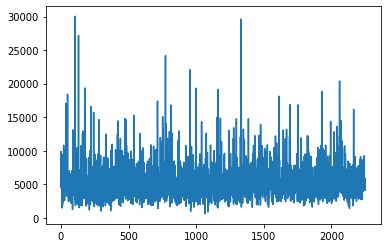

In [ ]:
import matplotlib.pyplot as plt
plt.plot(troves["Ether_Quantity"])
plt.show()

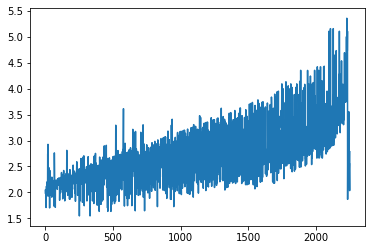

In [ ]:
plt.plot(troves["CR_initial"])
plt.show()

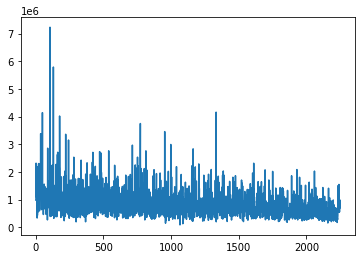

In [ ]:
plt.plot(troves["Supply"])
plt.show()

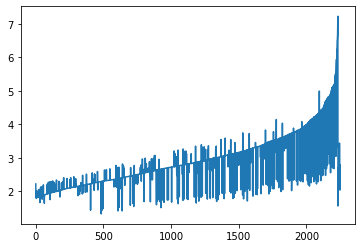

In [ ]:
plt.plot(troves["CR_current"])
plt.show()

In [ ]:
data.describe()

,Price_LUSD,Price_Ether,n_open,n_close,n_liquidate,n_redempt,n_troves,stability,liquidity,redemption_pool,supply_LUSD,return_stability,airdrop_gain,liquidation_gain,issuance_fee,redemption_fee,price_LQTY,MC_LQTY,annualized_earning
count,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8.760000e+03,8.760000e+03,8.760000e+03,8.760000e+03,8760.000000,8760.000000,8760.000000,8760.000000,8.760000e+03,8760.000000,8.760000e+03,8.760000e+03
mean,1.008479,506.482122,0.825799,0.551941,0.007877,0.009018,557.018265,4.399055e+08,8.615362e+07,1.304409e+04,5.260461e+08,0.741385,41407.411443,856.741167,9025.862505,4.898388e+02,21.776451,2.889440e+08,7.907340e+07
std,0.007844,155.189165,0.927204,0.535568,0.137855,0.623061,523.487601,4.289873e+08,6.646742e+07,7.881948e+05,4.930780e+08,0.102364,39124.829444,15372.539369,17307.062581,3.396843e+04,20.585470,3.432977e+08,3.742231e+07
min,0.990000,183.829982,0.000000,0.000000,0.000000,0.000000,6.000000,8.661897e+06,1.355478e+06,0.000000e+00,1.088800e+07,0.000000,0.000000,-1904.807783,0.000000,0.000000e+00,0.400000,0.000000e+00,0.000000e+00
25%,1.002822,398.917369,0.000000,0.000000,0.000000,0.000000,152.000000,1.023974e+08,2.950215e+07,0.000000e+00,1.337349e+08,0.677245,10954.072934,0.000000,0.000000,0.000000e+00,5.757972,3.056036e+07,4.644810e+07
50%,1.010239,497.724409,1.000000,1.000000,0.000000,0.000000,429.000000,2.582239e+08,7.110631e+07,0.000000e+00,3.339762e+08,0.720200,22979.640154,0.000000,7026.685443,0.000000e+00,12.081349,1.175395e+08,6.827068e+07
75%,1.012619,605.372688,1.000000,1.000000,0.000000,0.000000,815.250000,6.659790e+08,1.310764e+08,0.000000e+00,7.990402e+08,0.783529,67881.130459,0.000000,12056.670037,0.000000e+00,35.686307,4.793969e+08,1.027866e+08
max,1.110000,1099.802214,17.000000,5.000000,5.000000,56.000000,2401.000000,1.561592e+09,4.563434e+08,7.004291e+07,1.945908e+09,1.069160,216173.213867,532835.436387,817156.995856,3.134024e+06,113.619896,1.888263e+09,2.281775e+08


new policy function

issuance fee = redemption fee = base rate


#**Simulation with Policy Function**

In [ ]:
#Defining Initials
initials = {"Price_LUSD":[1.00], "Price_Ether":[price_ether_initial], "n_open":[initial_open], "n_close":[0], "n_liquidate": [0], "n_redempt":[0], 
            "n_troves":[initial_open], "stability":[stability_initial], "liquidity":[0], "redemption_pool":[0],
            "supply_LUSD":[0],  "return_stability":[initial_return], "airdrop_gain":[0], "liquidation_gain":[0],  "issuance_fee":[0], "redemption_fee":[0],
            "price_LQTY":[price_LQTY_initial], "MC_LQTY":[0], "annualized_earning":[0], "base_rate":[base_rate_initial]}
data2 = pd.DataFrame(initials)
troves2= pd.DataFrame({"Ether_Price":[], "Ether_Quantity":[], "CR_initial":[], 
              "Supply":[], "Rational_inattention":[], "CR_current":[]})
result_open = open_troves(troves2, 0, data2['Price_LUSD'][0])
troves2 = result_open[0]
issuance_LUSD_open = result_open[2]
data2.loc[0,'issuance_fee'] = issuance_LUSD_open * initials["Price_LUSD"][0]
data2.loc[0,'supply_LUSD'] = troves2["Supply"].sum()
data2.loc[0,'liquidity'] = 0.5*troves2["Supply"].sum()
data2.loc[0,'stability'] = 0.5*troves2["Supply"].sum()

#Simulation Process
#print("Decay:      ", base_rate_decay)
#print("Beta:       ", base_rate_beta)
for index in range(1, n_sim):
#exogenous ether price input
  price_ether_current = price_ether[index]
  troves2['Ether_Price'] = price_ether_current
  price_LUSD_previous = data2.loc[index-1,'Price_LUSD']
  price_LQTY_previous = data2.loc[index-1,'price_LQTY']

#policy function determine base rate
  #print("Prev rate:  ", data2.loc[index-1,'base_rate'])
  #print("Redemption: ", data2.loc[index-1,'redemption_pool'])
  #print("Supply:     ", troves2['Supply'].sum())
  base_rate_current = base_rate_decay * data2.loc[index-1,'base_rate'] + \
                      data2.loc[index-1,'redemption_pool'] / troves2['Supply'].sum() / base_rate_beta
  #print("New rate:   ", base_rate_current)
  rate_issuance = rate_issuance_min + base_rate_current / 5
  #print("Issuance:   ", rate_issuance)
  rate_redemption = rate_redemption_min + base_rate_current
  #print("Redemption: ", rate_redemption)

#trove liquidation & return of stability pool
  result_liquidation = liquidate_troves(troves2, index, data2)
  troves2 = result_liquidation[0]
  return_stability = result_liquidation[1]
  debt_liquidated = result_liquidation[2]
  ether_liquidated = result_liquidation[3]
  liquidation_gain = result_liquidation[4]
  airdrop_gain = result_liquidation[5]
  n_liquidate = result_liquidation[6]

  #print("After liquidate")

#close troves
  result_close = close_troves(troves2, index, price_LUSD_previous)
  troves2 = result_close[0]
  n_close = result_close[1]
  #if n_close<0:
  #  break

  #print("After close")

#adjust troves
  result_adjustment = adjust_troves(troves2, index)
  troves2 = result_adjustment[0]
  issuance_LUSD_adjust = result_adjustment[1]

  #print("After adjust")

#open troves
  result_open = open_troves(troves2, index, price_LUSD_previous)
  troves2 = result_open[0]
  n_open = result_open[1]  
  issuance_LUSD_open = result_open[2]

  #print("After open")

#Stability Pool
  #print("Supply:     ", troves2['Supply'].sum())
  stability_pool = stability_update(data2.loc[index-1,'stability'], return_stability, index, troves2['Supply'].sum())

  #print("After SP update")

#Calculating Price, Liquidity Pool, and Redemption
  result_price = price_stabilizer(troves2, index, data2, stability_pool, n_open)
  price_LUSD_current = result_price[0]
  liquidity_pool = result_price[1]
  troves2 = result_price[2]
  issuance_LUSD_stabilizer = result_price[3]
  redemption_fee = result_price[4]
  n_redempt = result_price[5]
  redemption_pool = result_price[6]
  n_open=result_price[7]
  #print("Liquidity: ", liquidity_pool)
  if liquidity_pool < 0:
    print("  ---->  Break!! (Liquidity)", liquidity_pool)
    break

  #print("After price stab")

#LQTY Market
  result_LQTY = LQTY_market(index, data2)
  price_LQTY_current = result_LQTY[0]
  annualized_earning = result_LQTY[1]
  MC_LQTY_current = result_LQTY[2]

  #print("After LQTY")

#Summary
  issuance_fee = price_LUSD_current * (issuance_LUSD_adjust + issuance_LUSD_open + issuance_LUSD_stabilizer)
  n_troves = troves2.shape[0]
  supply_LUSD = troves2['Supply'].sum()
  if index >= month:
    price_LQTY.append(price_LQTY_current)

  #print("After summary")

  new_row = {"Price_LUSD":float(price_LUSD_current), "Price_Ether":float(price_ether_current), "n_open":float(n_open), "n_close":float(n_close), 
             "n_liquidate":float(n_liquidate), "n_redempt": float(n_redempt), "n_troves":float(n_troves),
              "stability":float(stability_pool), "liquidity":float(liquidity_pool), "redemption_pool":float(redemption_pool), "supply_LUSD":float(supply_LUSD),
             "issuance_fee":float(issuance_fee), "redemption_fee":float(redemption_fee),
             "airdrop_gain":float(airdrop_gain), "liquidation_gain":float(liquidation_gain), "return_stability":float(return_stability), 
             "annualized_earning":float(annualized_earning), "MC_LQTY":float(MC_LQTY_current), "price_LQTY":float(price_LQTY_current), 
             "base_rate":float(base_rate_current)}
  data2 = data2.append(new_row, ignore_index=True)
  if price_LUSD_current < 0:
    print("  ---->  Break!! (LUSD price)", price_LUSD_current)
    break
  #print(" ------------------------------ ")


In [ ]:
data2

,Price_LUSD,Price_Ether,n_open,n_close,n_liquidate,n_redempt,n_troves,stability,liquidity,redemption_pool,supply_LUSD,return_stability,airdrop_gain,liquidation_gain,issuance_fee,redemption_fee,price_LQTY,MC_LQTY,annualized_earning,base_rate
0,1.000000,1000.000000,10.0,0.0,0.0,0.0,10.0,8.661897e+06,8.661897e+06,0.0,1.732379e+07,0.200000,0.000000,0.0,173237.933397,0.0,0.400000,0.000000e+00,0.000000e+00,0.000000
1,1.004110,993.184576,1.0,1.0,0.0,0.0,10.0,8.666320e+06,7.989150e+06,0.0,1.665547e+07,0.000000,761.040000,0.0,9066.227883,0.0,0.400000,1.054977e+03,7.461782e+06,0.000000
2,1.013512,980.403956,0.0,1.0,0.0,0.0,9.0,8.682350e+06,6.628443e+06,0.0,1.531079e+07,0.383059,761.040000,0.0,0.000000,0.0,0.402365,2.122345e+03,1.054333e+07,0.000000
3,1.024403,1003.570020,0.0,1.0,0.0,0.0,8.0,8.707924e+06,5.349382e+06,0.0,1.405731e+07,0.505073,765.539686,0.0,0.000000,0.0,0.404183,3.197776e+03,1.296641e+07,0.000000
4,1.005076,1046.038195,1.0,0.0,0.0,0.0,9.0,8.740306e+06,7.846878e+06,0.0,1.658718e+07,0.561620,768.998804,0.0,12713.599234,0.0,0.405060,4.272778e+03,1.496493e+07,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8755,0.998523,429.588108,1.0,1.0,0.0,0.0,1304.0,6.765264e+08,4.570841e+08,0.0,1.133611e+09,0.611205,59173.527199,0.0,5078.779602,0.0,31.089327,5.179504e+08,6.221417e+07,0.000618
8756,0.998495,436.327113,1.0,1.0,0.0,0.0,1304.0,6.756645e+08,4.583207e+08,0.0,1.133985e+09,0.610734,59150.554309,0.0,4762.537875,0.0,31.106316,5.182745e+08,6.224105e+07,0.000567
8757,0.998952,419.835912,0.0,1.0,0.0,0.0,1303.0,6.758116e+08,4.536190e+08,0.0,1.129431e+09,0.611895,59182.877105,0.0,0.000000,0.0,31.114208,5.184470e+08,6.224973e+07,0.000520
8758,0.999036,420.649856,1.0,1.0,0.0,0.0,1303.0,6.763928e+08,4.532779e+08,0.0,1.129671e+09,0.611848,59197.892638,0.0,4398.461560,0.0,31.084906,5.179998e+08,6.218401e+07,0.000477


#**Exhibition Part 2**

In [ ]:
fig = make_subplots(specs=[[{"secondary_y": True}]])
fig.add_trace(
    go.Scatter(x=data.index/720, y=data['Price_LUSD'], name="LUSD Price"),
    secondary_y=False,
)
fig.add_trace(
    go.Scatter(x=data.index/720, y=data['Price_Ether'], name="Ether Price"),
    secondary_y=True,
)
fig.add_trace(
    go.Scatter(x=data2.index/720, y=data2['Price_LUSD'], name="LUSD Price New", line = dict(dash='dot')),
    secondary_y=False,
)
fig.update_layout(
    title_text="Price Dynamics of LUSD and Ether"
)
fig.update_xaxes(tick0=0, dtick=1, title_text="Month")
fig.update_yaxes(title_text="LUSD Price", secondary_y=False)
fig.update_yaxes(title_text="Ether Price", secondary_y=True)
fig.show()

In [ ]:
fig = make_subplots(specs=[[{"secondary_y": True}]])
fig.add_trace(
    go.Scatter(x=data.index/720, y=data['n_troves'], name="Number of Troves"),
    secondary_y=False,
)
fig.add_trace(
    go.Scatter(x=data.index/720, y=data['supply_LUSD'], name="LUSD Supply"),
    secondary_y=True,
)
fig.add_trace(
    go.Scatter(x=data2.index/720, y=data2['n_troves'], name="Number of Troves New", line = dict(dash='dot')),
    secondary_y=False,
)
fig.add_trace(
    go.Scatter(x=data2.index/720, y=data2['supply_LUSD'], name="LUSD Supply New", line = dict(dash='dot')),
    secondary_y=True,
)
fig.update_layout(
    title_text="Dynamics of Trove Numbers and LUSD Supply"
)
fig.update_xaxes(tick0=0, dtick=1, title_text="Month")
fig.update_yaxes(title_text="Number of Troves", secondary_y=False)
fig.update_yaxes(title_text="LUSD Supply", secondary_y=True)
fig.show()

In [ ]:
fig = make_subplots(rows=2, cols=2)
fig.add_trace(
    go.Scatter(x=data.index/720, y=data['n_open'], name="Number of Troves Opened", mode='markers'),
    row=1, col=1, secondary_y=False
)
fig.add_trace(
    go.Scatter(x=data.index/720, y=data['n_close'], name="Number of Troves Closed", mode='markers'),
    row=2, col=1, secondary_y=False
)
fig.add_trace(
    go.Scatter(x=data2.index/720, y=data2['n_open'], name="Number of Troves Opened New", mode='markers'),
    row=1, col=2, secondary_y=False
)
fig.add_trace(
    go.Scatter(x=data2.index/720, y=data2['n_close'], name="Number of Troves Closed New", mode='markers'),
    row=2, col=2, secondary_y=False
)
fig.update_layout(
    title_text="Dynamics of Number of Troves Opened and Closed"
)
fig.update_xaxes(tick0=0, dtick=1, title_text="Month")
fig.update_yaxes(title_text="Troves Opened", row=1, col=1)
fig.update_yaxes(title_text="Troves Closed", row=2, col=1)
fig.show()

In [ ]:
fig = make_subplots(rows=2, cols=1)
fig.add_trace(
    go.Scatter(x=data.index/720, y=data['n_liquidate'], name="Number of Liquidated Troves"),
    row=1, col=1, secondary_y=False
)
fig.add_trace(
    go.Scatter(x=data.index/720, y=data['n_redempt'], name="Number of Redempted Troves"),
    row=2, col=1, secondary_y=False
)
fig.add_trace(
    go.Scatter(x=data2.index/720, y=data2['n_liquidate'], name="Number of Liquidated Troves New", line = dict(dash='dot')),
    row=1, col=1, secondary_y=False
)
fig.add_trace(
    go.Scatter(x=data2.index/720, y=data2['n_redempt'], name="Number of Redempted Troves New", line = dict(dash='dot')),
    row=2, col=1, secondary_y=False
)
fig.update_layout(
    title_text="Dynamics of Number of Liquidated and Redempted Troves"
)
fig.update_xaxes(tick0=0, dtick=1, title_text="Month")
fig.update_yaxes(title_text="Troves Liquidated", row=1, col=1)
fig.update_yaxes(title_text="Troves Redempted", row=2, col=1)
fig.show()

In [ ]:
fig = make_subplots(specs=[[{"secondary_y": True}]])
fig.add_trace(
    go.Scatter(x=data.index/720, y=data['liquidity'], name="Liquidity Pool"),
    secondary_y=False,
)
fig.add_trace(
    go.Scatter(x=data.index/720, y=data['stability'], name="Stability Pool"),
    secondary_y=False,
)
fig.add_trace(
    go.Scatter(x=data.index/720, y=data['redemption_pool'], name="Redemption Pool"),
    secondary_y=False,
)
fig.add_trace(
    go.Scatter(x=data2.index/720, y=data2['liquidity'], name="Liquidity Pool New", line = dict(dash='dot')),
    secondary_y=False,
)
fig.add_trace(
    go.Scatter(x=data2.index/720, y=data2['stability'], name="Stability Pool New", line = dict(dash='dot')),
    secondary_y=False,
)
fig.add_trace(
    go.Scatter(x=data2.index/720, y=data2['redemption_pool'], name="Redemption Pool New", line = dict(dash='dot')),
    secondary_y=False,
)
fig.update_layout(
    title_text="Dynamics of Liquidity, Stability, Redemption Pools and Return of Stability Pool"
)
fig.update_xaxes(tick0=0, dtick=1, title_text="Month")
fig.update_yaxes(title_text="Size of Pools", secondary_y=False)
fig.show()

In [ ]:
fig = make_subplots(specs=[[{"secondary_y": True}]])
fig.add_trace(
    go.Scatter(x=data.index/720, y=data['return_stability'], name="Return of Stability Pool"),
    secondary_y=False,
)
fig.add_trace(
    go.Scatter(x=data2.index/720, y=data2['return_stability'], name="Return of Stability Pool New", line = dict(dash='dot')),
    secondary_y=False,
)
fig.update_layout(
    title_text="Dynamics of Liquidity, Stability, Redemption Pools and Return of Stability Pool"
)
fig.update_xaxes(tick0=0, dtick=1, title_text="Month")
fig.update_yaxes(title_text="Return", secondary_y=False)
fig.show()

In [ ]:
fig = make_subplots(specs=[[{"secondary_y": True}]])
fig.add_trace(
    go.Scatter(x=data.index/720, y=data['airdrop_gain'], name="Airdrop Gain"),
    secondary_y=False,
)
fig.add_trace(
    go.Scatter(x=data.index/720, y=data['liquidation_gain'], name="Liquidation Gain"),
    secondary_y=True,
)
fig.add_trace(
    go.Scatter(x=data2.index/720, y=data2['airdrop_gain'], name="Airdrop Gain New", line = dict(dash='dot')),
    secondary_y=False,
)
fig.add_trace(
    go.Scatter(x=data2.index/720, y=data2['liquidation_gain'], name="Liquidation Gain New", line = dict(dash='dot')),
    secondary_y=True,
)
fig.update_layout(
    title_text="Dynamics of Airdrop and Liquidation Gain"
)
fig.update_xaxes(tick0=0, dtick=1, title_text="Month")
fig.update_yaxes(title_text="Airdrop Gain", secondary_y=False)
fig.update_yaxes(title_text="Liquidation Gain", secondary_y=True)
fig.show()

In [ ]:
fig = make_subplots(rows=2, cols=1)
fig.add_trace(
    go.Scatter(x=data.index/720, y=data['issuance_fee'], name="Issuance Fee"),
    row=1, col=1
)
fig.add_trace(
    go.Scatter(x=data.index/720, y=data['redemption_fee'], name="Redemption Fee"),
    row=2, col=1
)
fig.add_trace(
    go.Scatter(x=data2.index/720, y=data2['issuance_fee'], name="Issuance Fee New", line = dict(dash='dot')),
    row=1, col=1
)
fig.add_trace(
    go.Scatter(x=data2.index/720, y=data2['redemption_fee'], name="Redemption Fee New", line = dict(dash='dot')),
    row=2, col=1
)
fig.update_layout(
    title_text="Dynamics of Issuance Fee and Redemption Fee"
)
fig.update_xaxes(tick0=0, dtick=1, title_text="Month")
fig.update_yaxes(title_text="Issuance Fee", secondary_y=False, row=1, col=1)
fig.update_yaxes(title_text="Redemption Fee", secondary_y=False, row=2, col=1)
fig.show()

In [ ]:
fig = make_subplots(specs=[[{"secondary_y": True}]])
fig.add_trace(
    go.Scatter(x=data.index/720, y=data['annualized_earning'], name="Annualized Earning"),
    secondary_y=False,
)
fig.add_trace(
    go.Scatter(x=data2.index/720, y=data2['annualized_earning'], name="Annualized Earning New", line = dict(dash='dot')),
    secondary_y=False,
)
fig.update_layout(
    title_text="Dynamics of Annualized Earning"
)
fig.update_xaxes(tick0=0, dtick=1, title_text="Month")
fig.update_yaxes(title_text="Annualized Earning", secondary_y=False)
fig.show()

In [ ]:
fig = make_subplots(specs=[[{"secondary_y": True}]])
fig.add_trace(
    go.Scatter(x=data.index/720, y=data['price_LQTY'], name="LQTY Price"),
    secondary_y=False,
)
fig.add_trace(
    go.Scatter(x=data.index/720, y=data['MC_LQTY'], name="LQTY Market Cap"),
    secondary_y=True,
)
fig.add_trace(
    go.Scatter(x=data2.index/720, y=data2['price_LQTY'], name="LQTY Price New", line = dict(dash='dot')),
    secondary_y=False,
)
fig.add_trace(
    go.Scatter(x=data2.index/720, y=data2['MC_LQTY'], name="LQTY Market Cap New", line = dict(dash='dot')),
    secondary_y=True,
)
fig.update_layout(
    title_text="Dynamics of the Price and Market Cap of LQTY"
)
fig.update_xaxes(tick0=0, dtick=1, title_text="Month")
fig.update_yaxes(title_text="LQTY Price", secondary_y=False)
fig.update_yaxes(title_text="LQTY Market Cap", secondary_y=True)
fig.show()

In [ ]:
fig = make_subplots(specs=[[{"secondary_y": True}]])
fig.add_trace(
    go.Scatter(x=data.index/720, y=[0.01] * n_sim, name="Base Rate"),
    secondary_y=False,
)
fig.add_trace(
    go.Scatter(x=data2.index/720, y=data2['base_rate'], name="Base Rate New"),
    secondary_y=False,
)
fig.update_layout(
    title_text="Dynamics of Issuance Fee and Redemption Fee"
)
fig.update_xaxes(tick0=0, dtick=1, title_text="Month")
fig.update_yaxes(title_text="Issuance Fee", secondary_y=False)
fig.update_yaxes(title_text="Redemption Fee", secondary_y=True)
fig.show()

In [ ]:
def trove2_histogram(measure):
  fig = px.histogram(troves2, x=measure, title='Distribution of '+measure, nbins=25)
  fig.show()

trove2_histogram('Ether_Quantity')
trove2_histogram('CR_initial')
trove2_histogram('Supply')
trove2_histogram('Rational_inattention')
trove2_histogram('CR_current')